In [23]:
import torch
import torch.nn as nn
import numpy as np
from torchvision import models
from torch.utils.data import Dataset , DataLoader , random_split
from torchvision import datasets, transforms
from pathlib import Path
import cv2
import matplotlib.pyplot as plt
SEED = 42

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


print(device)
save_dir = Path.cwd()

cuda


# Phase 1



## Loading Caltech

In [2]:
train_transformer  = transforms.Compose([
    transforms.Lambda(lambda img: img.convert("RGB")), #i currently have an older version of pytorch 
    transforms.Resize((224,224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),])

test_transformer  = transforms.Compose([
    transforms.Lambda(lambda img: img.convert("RGB")),
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

dataset = datasets.Caltech101( root= save_dir, download= True)

classes = dataset.categories
# print(classes)
# print (len(classes))


n = len(dataset)
n_train = int(0.7 * n)
n_val   = int(0.15 * n)
# n_test  = int(0.15 * n)
n_test = n - n_train - n_val

"""so that eval and test don't also get get this horizontal flip, i guess i can 0 it to avoid all this drama 
but i'm keeping in my mind that i may want to do more things on the train not the test

it was CLAUDE's idea to override parent's methods, i asked it what's an easier way rather than separating everything into train and test
"""
class TransformWrapper(torch.utils.data.Dataset):
    def __init__(self, subset, transform):
        self.subset = subset
        self.transform = transform
    def __len__(self):
        return len(self.subset)
    def __getitem__(self, idx):
        img, label = self.subset[idx]      # raw PIL image, untransformed
        img = self.transform(img)
        return img, label

train_set , val_set , test_set = random_split(dataset, [n_train, n_val, n_test], generator=torch.Generator().manual_seed(SEED))
train_set = TransformWrapper(train_set, train_transformer)
val_set   = TransformWrapper(val_set  , test_transformer)
test_set  = TransformWrapper(test_set , test_transformer)

## Loading Pretrained models to transfer learning 

In [3]:
n_classes = len(classes)

resnet_model = models.resnet34(weights =models.ResNet34_Weights.IMAGENET1K_V1 )
mv2_model    = models.mobilenet_v2(weights=models.MobileNet_V2_Weights.IMAGENET1K_V1)

for model, final_layer in [(resnet_model, resnet_model.layer4),(mv2_model, mv2_model.features[18])]:
    ##freeze everything
    for param in model.parameters():
        param.requires_grad = False

    #unfreezing last layer
    for param in final_layer.parameters():
        param.requires_grad = True

resnet_model.fc            = nn.Linear(resnet_model.fc.in_features, n_classes)
mv2_model.classifier[1]    = nn.Linear(mv2_model.classifier[1].in_features, n_classes)

resnet_model = resnet_model.to(device)
mv2_model    = mv2_model.to(device)

## Training 

In [4]:
criterion = nn.CrossEntropyLoss()


def train_model (model , train_loader , val_loader , epochs = 10 , lr = 1e-3):
    #pass only params that aren't freezed , params of the last layer n this case
    non_freezed_params = filter(lambda p: p.requires_grad, model.parameters())
    optimizer = torch.optim.Adam(non_freezed_params , lr = lr)

    history = {"train_loss": [], "val_acc": []}

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0

        for imgs, labels in train_loader:
            imgs, labels = imgs.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(imgs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * imgs.size(0)

        train_loss = running_loss / len(train_loader.dataset)
        val_acc = evaluate(model, val_loader)

        history["train_loss"].append(train_loss)
        history["val_acc"].append(val_acc)

        print(f"Epoch {epoch+1}/{epochs} | Train Loss: {train_loss:.4f} | Val Acc: {val_acc:.4f}")

    return model, history


def evaluate(model, loader):
    model.eval()
    running_loss ,correct, total = 0, 0, 0
    with torch.no_grad():
        for imgs, labels in loader:
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = model(imgs)
            #highest probability of the softmax
            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
        return correct / total

In [5]:
train_loader = DataLoader(train_set, batch_size=8, shuffle=True,  num_workers=8)
val_loader   = DataLoader(val_set,   batch_size=8, shuffle=False, num_workers=8)
test_loader  = DataLoader(test_set,  batch_size=8, shuffle=False, num_workers=8)

resnet_model, resnet_history = train_model(resnet_model, train_loader, val_loader, epochs=10)
resnet_test_acc = evaluate(resnet_model, test_loader)
print(f"ResNet34 test acc: {resnet_test_acc:.4f}")
torch.save(resnet_model.state_dict(), save_dir / "resnet34_caltech101.pth")

Epoch 1/10 | Train Loss: 1.6899 | Val Acc: 0.8017
Epoch 2/10 | Train Loss: 0.6378 | Val Acc: 0.8793
Epoch 3/10 | Train Loss: 0.3789 | Val Acc: 0.9147
Epoch 4/10 | Train Loss: 0.2954 | Val Acc: 0.8855
Epoch 5/10 | Train Loss: 0.2191 | Val Acc: 0.9124
Epoch 6/10 | Train Loss: 0.1933 | Val Acc: 0.9262
Epoch 7/10 | Train Loss: 0.1546 | Val Acc: 0.9216
Epoch 8/10 | Train Loss: 0.1467 | Val Acc: 0.9208
Epoch 9/10 | Train Loss: 0.1266 | Val Acc: 0.9270
Epoch 10/10 | Train Loss: 0.0992 | Val Acc: 0.9424
ResNet34 test acc: 0.9194


In [6]:

mv2_model, mv2_history = train_model(mv2_model, train_loader, val_loader, epochs=10)
mv2_test_acc = evaluate(mv2_model, test_loader)
print(f"MobileNetV2 test acc: {mv2_test_acc:.4f}")
torch.save(mv2_model.state_dict(), save_dir / "mv2_caltech101.pth")


Epoch 1/10 | Train Loss: 1.1016 | Val Acc: 0.8947
Epoch 2/10 | Train Loss: 0.3746 | Val Acc: 0.9170
Epoch 3/10 | Train Loss: 0.2625 | Val Acc: 0.9162
Epoch 4/10 | Train Loss: 0.2252 | Val Acc: 0.9016
Epoch 5/10 | Train Loss: 0.1943 | Val Acc: 0.8985
Epoch 6/10 | Train Loss: 0.1729 | Val Acc: 0.8978
Epoch 7/10 | Train Loss: 0.1657 | Val Acc: 0.9139
Epoch 8/10 | Train Loss: 0.1555 | Val Acc: 0.9147
Epoch 9/10 | Train Loss: 0.1226 | Val Acc: 0.9131
Epoch 10/10 | Train Loss: 0.1262 | Val Acc: 0.9085
MobileNetV2 test acc: 0.9048


# Phase 2 : Function 

#### https://www.tensorflow.org/tutorials/generative/adversarial_fgsm

In [7]:
mean = torch.tensor([0.485, 0.456, 0.406]).view(1,3,1,1).to(device)
std  = torch.tensor([0.229, 0.224, 0.225]).view(1,3,1,1).to(device)

#since we normalized the images in the start so they're no longer 0s , 1s 
def clamp_normalized(images):
    min_val = (0 - mean) / std
    max_val = (1 - mean) / std
    return torch.max(torch.min(images, max_val), min_val)

In [8]:
def attack(model , images , labels, epsilon) :
    images = images.clone().detach().to(device)
    labels = labels.to(device)
    images.requires_grad = True

    outputs = model(images)
    loss = criterion(outputs , labels)
    model.zero_grad()
    loss.backward()

    #sign of the gradient w.r.t. input
    grad_sign = images.grad.data.sign()
    perturbed_images = images + epsilon * grad_sign

    #Clamp in normalized space using the per-channel min/max after normalization.
    perturbed_images = clamp_normalized(perturbed_images)

    return perturbed_images.detach()


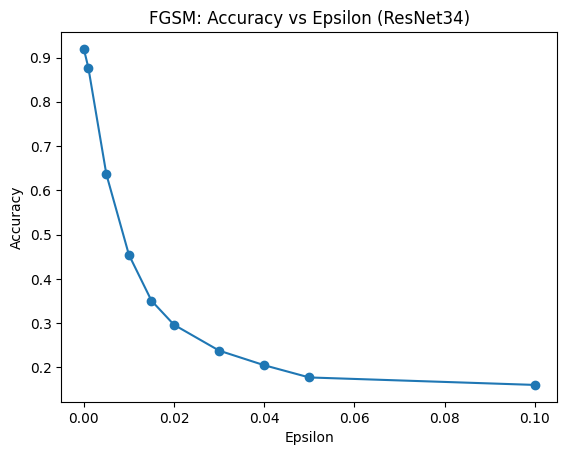

'\n\ni guess starting from epsilion \n'

In [ ]:
def evaluate_under_attack(model, loader, epsilon):
    model.eval()
    correct, total = 0, 0
    for imgs, labels in loader:
        imgs, labels = imgs.to(device), labels.to(device)
        adv_imgs = attack(model, imgs, labels, epsilon)
        with torch.no_grad():
            outputs = model(adv_imgs)
            preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)
    return correct / total

epsilons = [0, 0.001, 0.005, 0.01 , 0.015 , 0.02 , 0.03 , 0.04 , 0.05, 0.1]
accuracies = [evaluate_under_attack(resnet_model, test_loader, e) for e in epsilons]

#plotting
plt.plot(epsilons, accuracies, marker='o')
plt.xlabel("Epsilon")
plt.ylabel("Accuracy")
plt.title("FGSM: Accuracy vs Epsilon (ResNet34)")
plt.savefig(save_dir / "fgsm_epsilon_sweep_resnet.png")
plt.show()

"""
i guess starting from epsilon= 0.005 it fully fails , it's unacceptable (below 50%) starting from 0.01
"""

# Phase 3 

#### Wanted to use SHAP since i already know it but read that it's slower for images 


In [19]:
def saliency_maps(model , image , label = None):
    model.eval()
    image = image.clone().detach().unsqueeze(0).to(device) 
    image.requires_grad = True

    output = model(image)
    if label is None:
        label = output.argmax(dim=1)

    score = output[0, label]
    model.zero_grad()
    score.backward()

    #takes max magnitude across channels to produce a single-channel map 
    saliency, _ = torch.max(image.grad.data.abs(), dim=1)
    saliency = saliency.squeeze().cpu().numpy()
    return saliency, label

In [20]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None

        target_layer.register_forward_hook(self.save_activation)
        target_layer.register_full_backward_hook(self.save_gradient)

    def save_activation(self, module, input, output):
        self.activations = output.detach()

    def save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def generate(self, image, label=None):
        self.model.eval()
        image = image.clone().detach().unsqueeze(0).to(device)

        output = self.model(image)
        if label is None:
            label = output.argmax(dim=1).item()

        score = output[0, label]
        self.model.zero_grad()
        score.backward()

        #
        weights = self.gradients.mean(dim=[2, 3], keepdim=True)  #[1, C, 1, 1]
        cam = (weights * self.activations).sum(dim=1, keepdim=True)  #[1, 1, H, W]
        cam = torch.relu(cam)  # only positive influence

        cam = cam.squeeze().cpu().numpy()
        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-8)  
        return cam, label

resnet_gradcam = GradCAM(resnet_model, resnet_model.layer4)
mv2_gradcam    = GradCAM(mv2_model, mv2_model.features[18])

In [21]:
## used AI for plotting 
def unnormalize(img_tensor):
    img = img_tensor.clone().cpu().squeeze()
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
    std  = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)
    img = img * std + mean
    img = img.clamp(0, 1)
    return img.permute(1, 2, 0).numpy()

def overlay_heatmap(img_np, heatmap):
    heatmap_resized = cv2.resize(heatmap, (img_np.shape[1], img_np.shape[0]))
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB) / 255.0
    overlay = 0.5 * img_np + 0.5 * heatmap_colored
    return overlay

def plot_explainability(model, gradcam, image_tensor, class_names, true_label=None):
    img_np = unnormalize(image_tensor)

    sal_map, pred_label = saliency_maps(model, image_tensor)
    cam_map, _ = gradcam.generate(image_tensor)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(img_np); axes[0].set_title(f"Input (pred: {class_names[pred_label]})"); axes[0].axis('off')
    axes[1].imshow(sal_map, cmap='hot'); axes[1].set_title("Saliency Map"); axes[1].axis('off')
    axes[2].imshow(overlay_heatmap(img_np, cam_map)); axes[2].set_title("Grad-CAM"); axes[2].axis('off')

    plt.tight_layout()
    plt.show()
    return fig

sys:1: UserWarning: Full backward hook is firing when gradients are computed with respect to module outputs since no inputs require gradients. See https://docs.pytorch.org/docs/main/generated/torch.nn.Module.html#torch.nn.Module.register_full_backward_hook for more details.


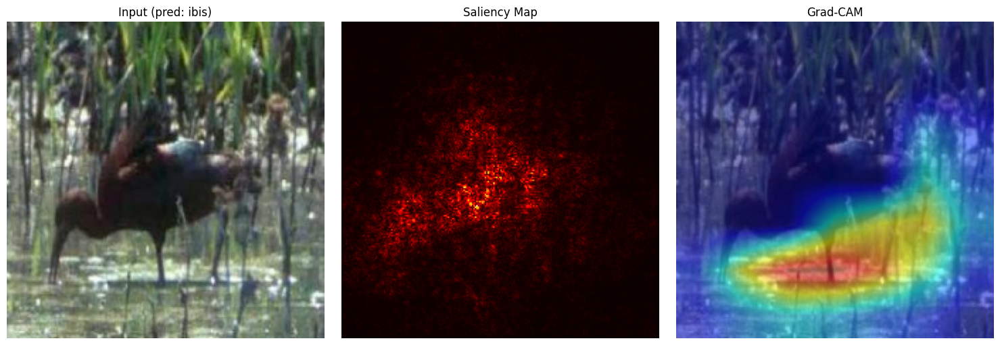

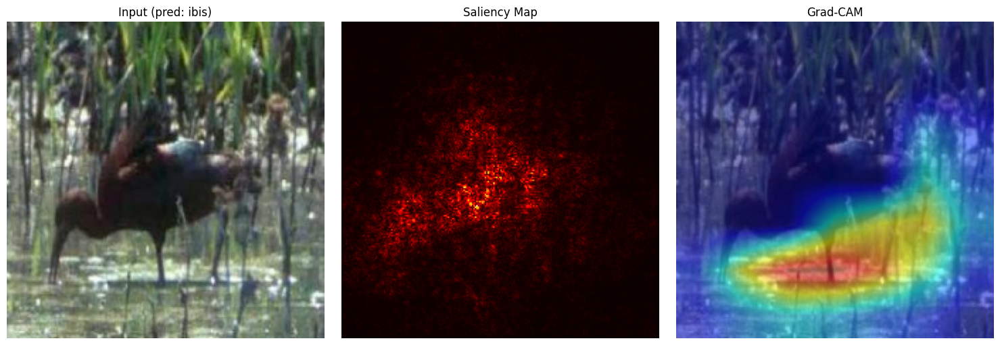

In [ ]:
img, label = test_set[0]
plot_explainability(resnet_model, resnet_gradcam, img, classes, true_label=label)

#saliency maps suffer from pixel-level gradient sensitivity — noisy, weakly localized on the bird.
# while grad cam clearly highlights the bird as the decisive region
#need to look more closely on those things tho 

# Phase 4 


In [27]:
def analysis(model , gradcam , image , true_label , class_names , epsilon):
    #prediction 
    with torch.no_grad():
        clean_pred = model(image.unsqueeze(0).to(device)).argmax(dim=1).item()
    print(f"Clean prediction: {class_names[clean_pred]}")
    plot_explainability(model, gradcam, image, class_names, true_label=true_label)

    #attack
    img_batch = image.unsqueeze(0).to(device)
    label_batch = torch.tensor([true_label]).to(device)
    adv_batch = attack(model, img_batch, label_batch, epsilon)

    with torch.no_grad():
        adv_pred = model(adv_batch).argmax(dim=1).item()

    #Noise visualization
    noise = (adv_batch - img_batch).squeeze().cpu().permute(1, 2, 0).numpy()
    noise_vis = (noise - noise.min()) / (noise.max() - noise.min() + 1e-8)
    plt.imshow(noise_vis); plt.title("Adversarial Noise"); plt.axis('off'); plt.show()

    #XAI of the attacked image 
    adv_image = adv_batch.squeeze(0).cpu()
    plot_explainability(model, gradcam, adv_image, class_names)

    return clean_pred, adv_pred

Clean prediction: ibis


sys:1: UserWarning: Full backward hook is firing when gradients are computed with respect to module outputs since no inputs require gradients. See https://docs.pytorch.org/docs/main/generated/torch.nn.Module.html#torch.nn.Module.register_full_backward_hook for more details.


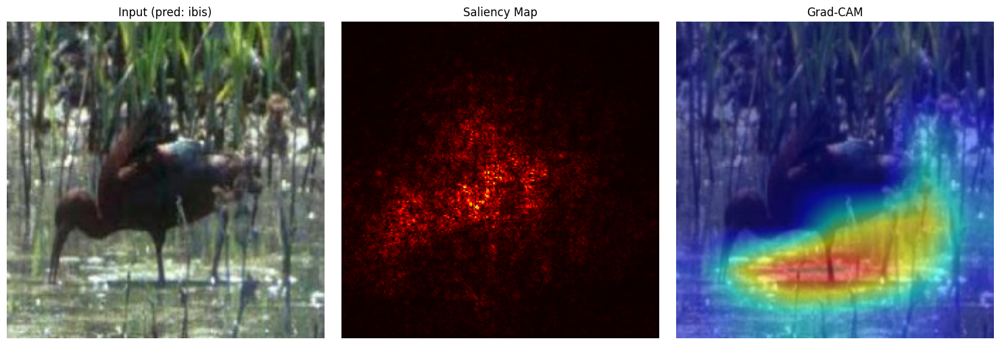

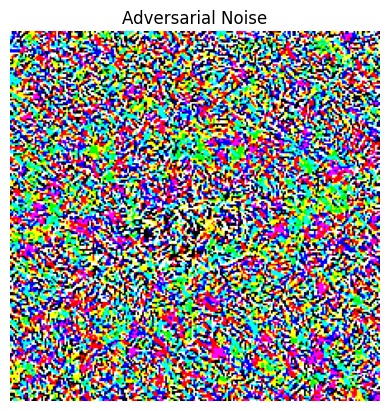

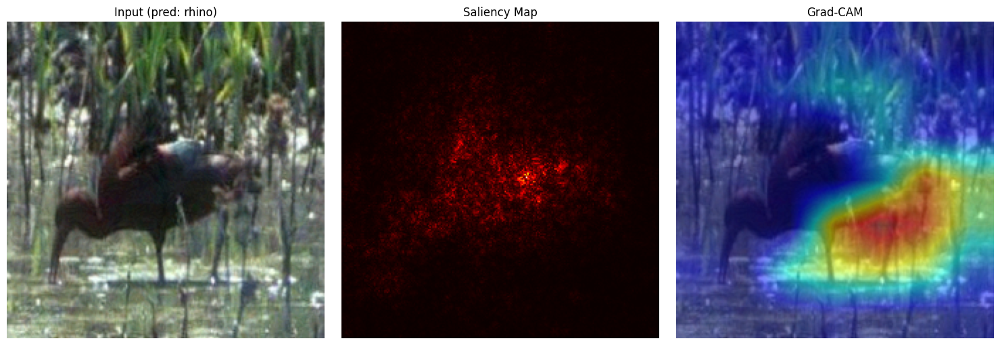


Clean prediction: strawberry


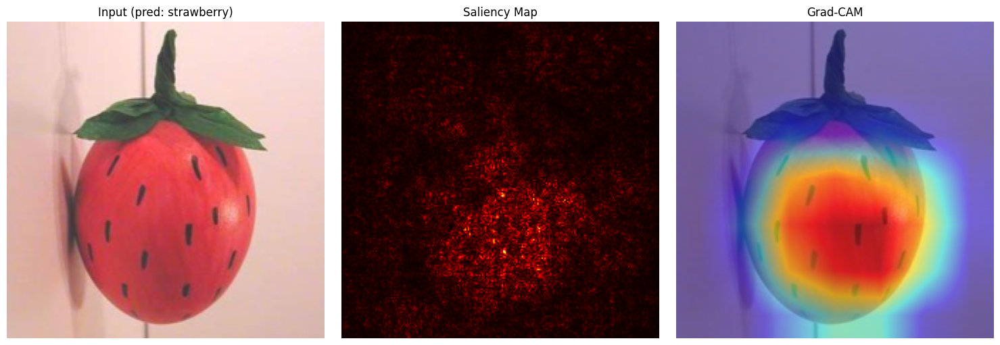

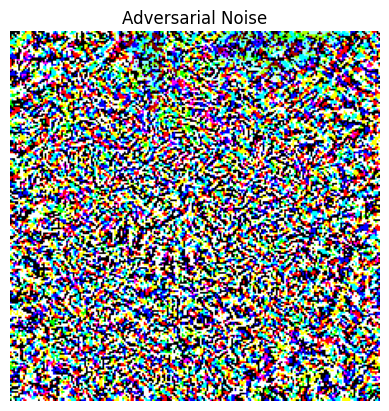

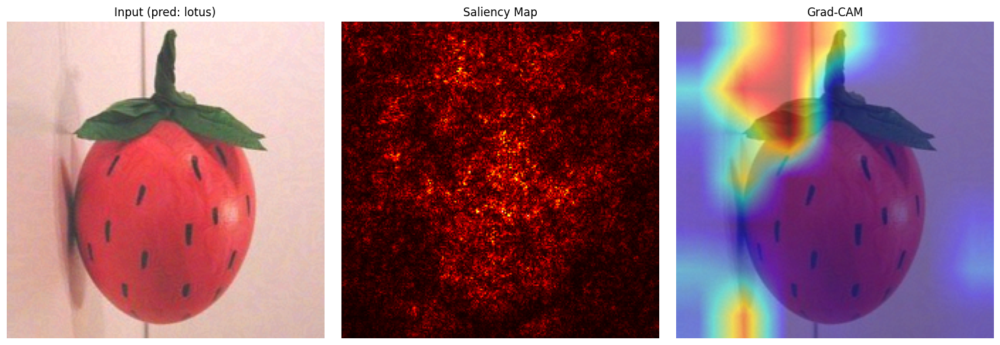


Clean prediction: airplanes


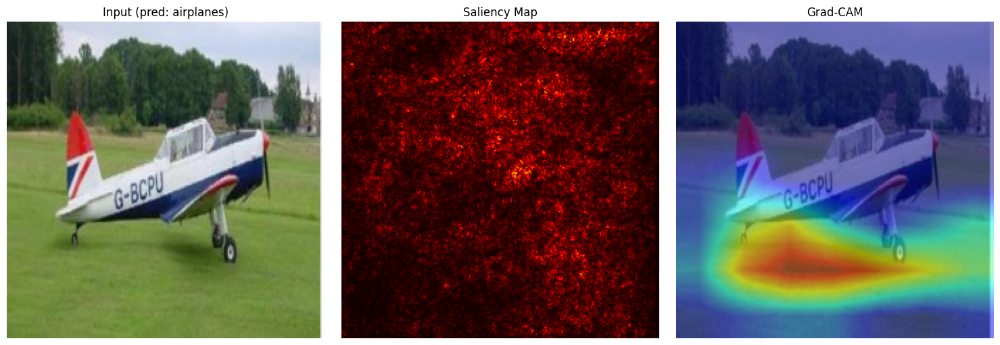

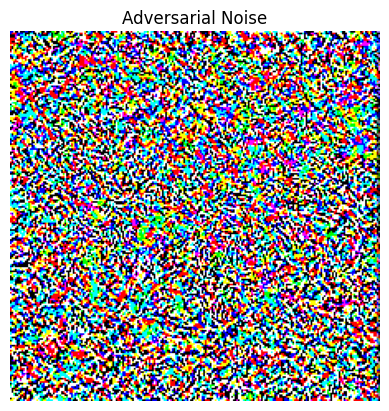

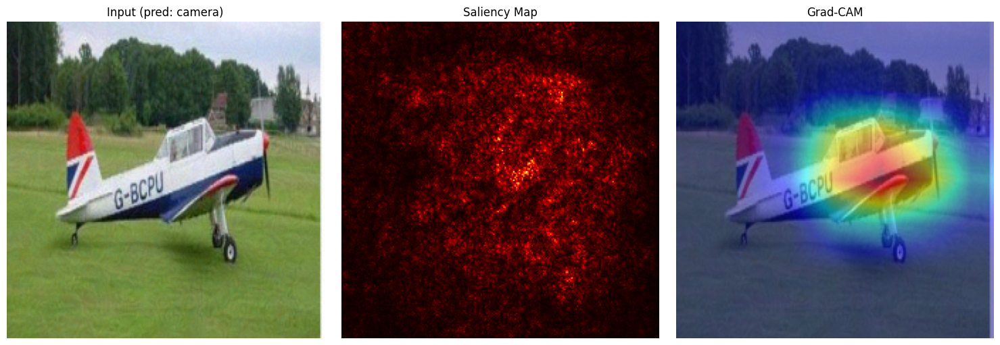


Clean prediction: ewer


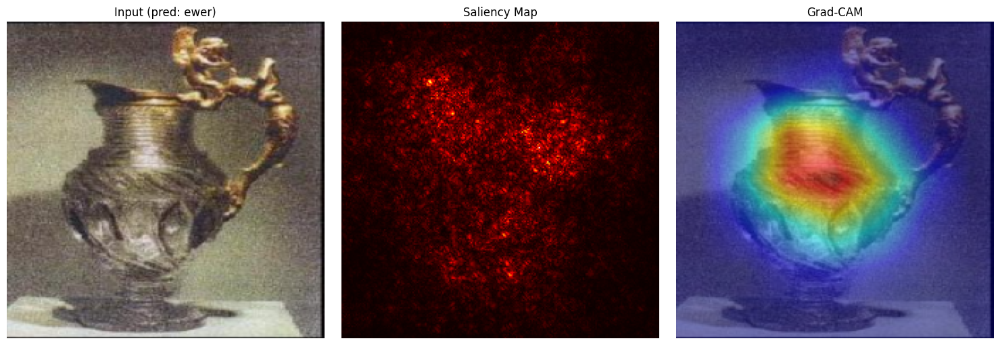

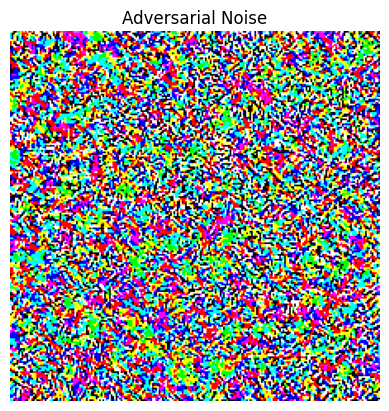

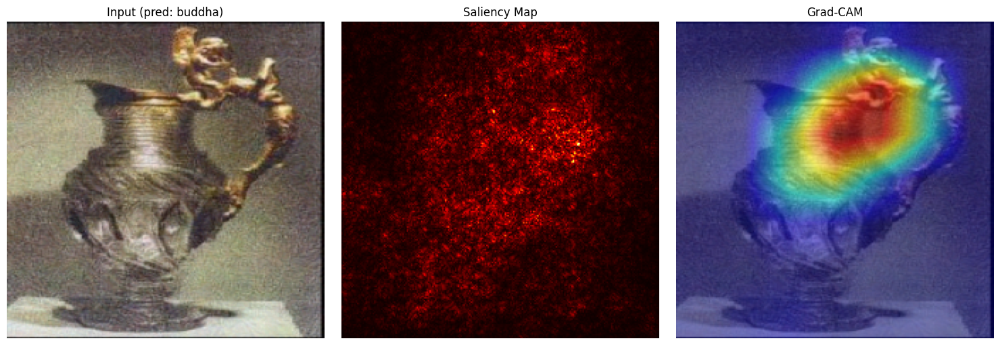


Clean prediction: yin_yang


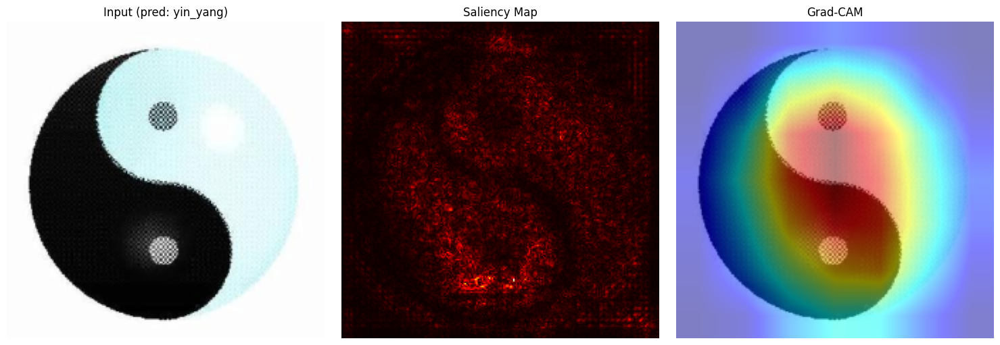

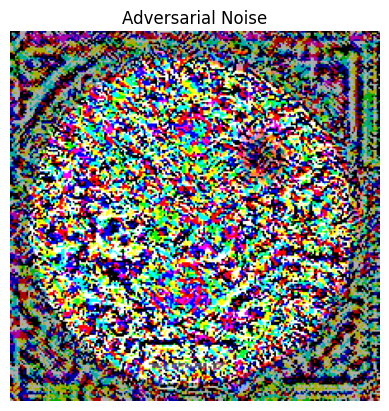

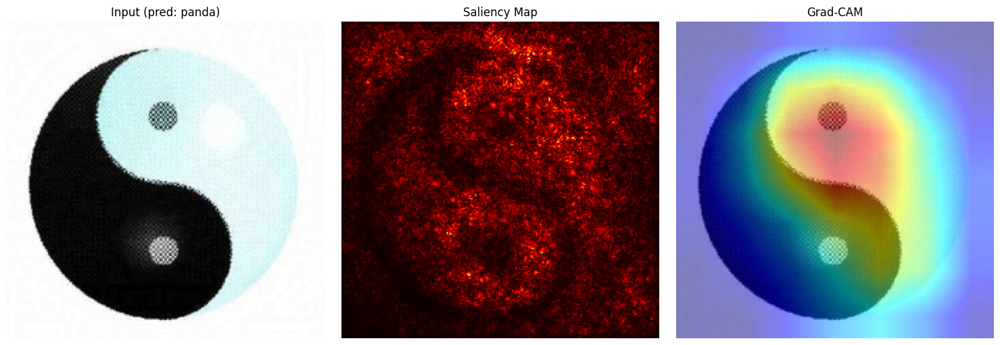


Clean prediction: laptop


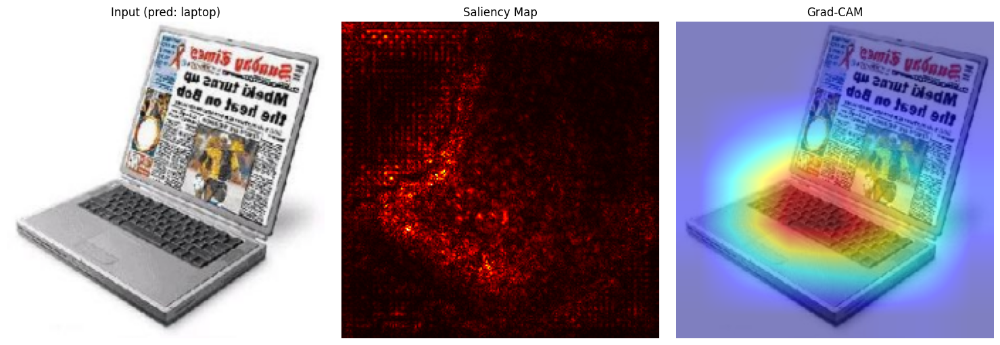

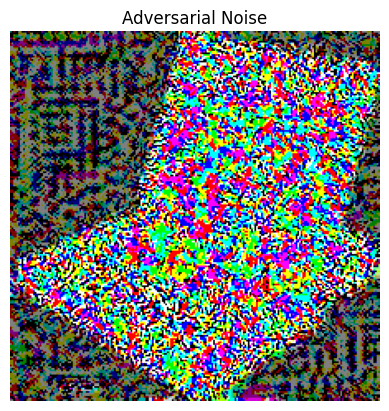

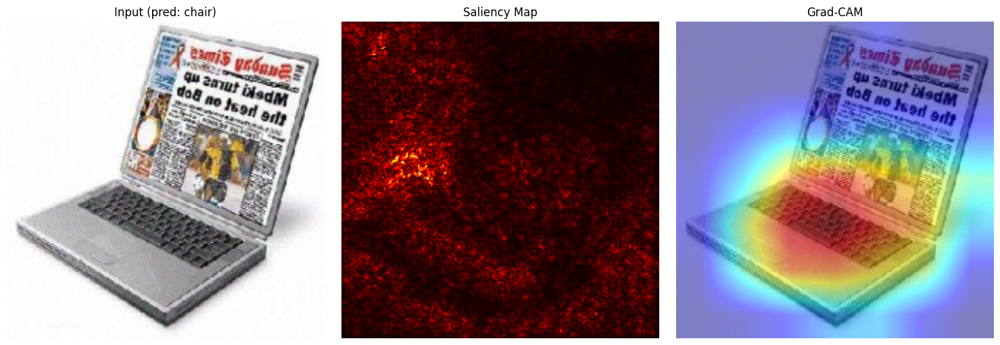


Clean prediction: flamingo_head


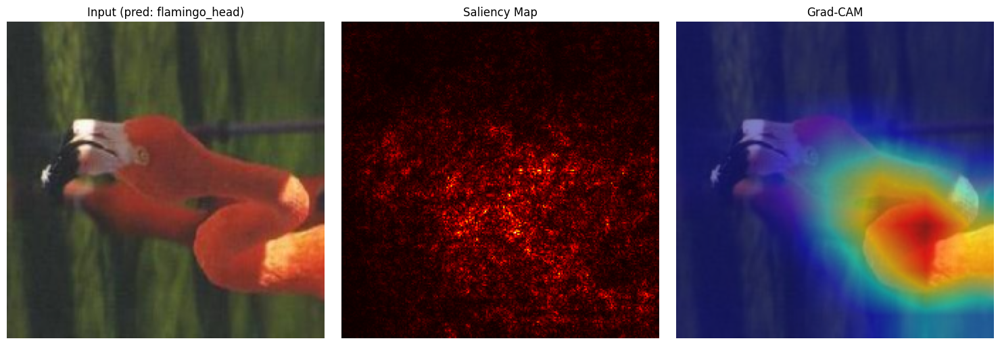

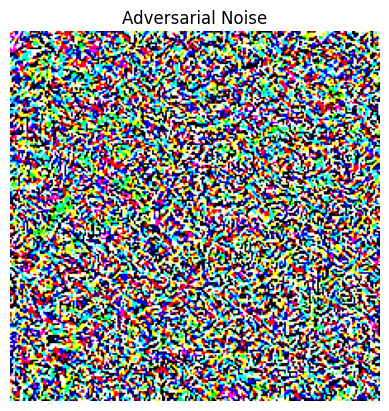

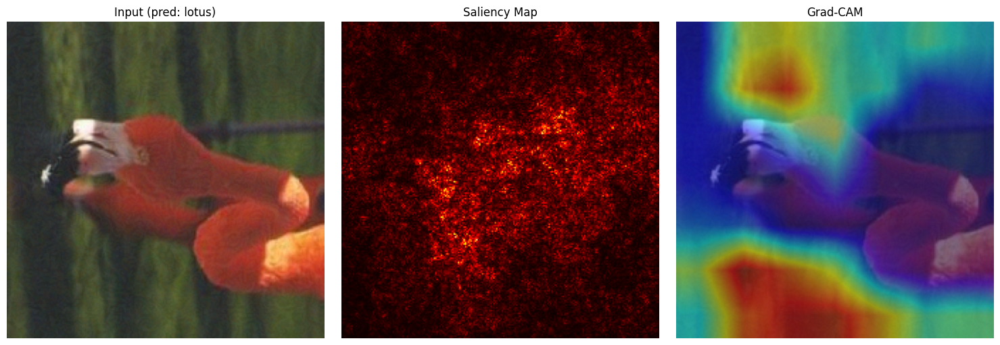

In [38]:
for i in range(7):
    img, label = test_set[i]
    clean_pred, adv_pred = analysis(resnet_model, resnet_gradcam, img, label, classes, epsilon=0.05)
    print()

# Phase 5 

In [31]:
def train_model_adv(model, train_loader, val_loader, epochs=10, lr=1e-3, train_epsilon=0.03):
    non_freezed_params = filter(lambda p: p.requires_grad, model.parameters())
    optimizer = torch.optim.Adam(non_freezed_params, lr=lr)

    history = {"train_loss": [], "val_acc": [], "val_acc_adv": []}

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0

        for imgs, labels in train_loader:
            imgs, labels = imgs.to(device), labels.to(device)

            #generate adversarial version of this batch using the model as it currently is
            adv_imgs = attack(model, imgs, labels, train_epsilon)

            optimizer.zero_grad()
            outputs_clean = model(imgs)
            outputs_adv   = model(adv_imgs)

            #train on both, so it doesn't just memorize the clean distribution
            loss = criterion(outputs_clean, labels) + criterion(outputs_adv, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * imgs.size(0)

        train_loss  = running_loss / len(train_loader.dataset)
        val_acc     = evaluate(model, val_loader)
        val_acc_adv = evaluate_under_attack(model, val_loader, train_epsilon)

        history["train_loss"].append(train_loss)
        history["val_acc"].append(val_acc)
        history["val_acc_adv"].append(val_acc_adv)

        print(f"Epoch {epoch+1}/{epochs} | Train Loss: {train_loss:.4f} | Val Acc (clean): {val_acc:.4f} | Val Acc (adv): {val_acc_adv:.4f}")

    return model, history


In [32]:
hardened_resnet_model = models.resnet34(weights=models.ResNet34_Weights.IMAGENET1K_V1)

#freeze everything
for param in hardened_resnet_model.parameters():
    param.requires_grad = False

#unfreeze last conv block , same as phase 1
for param in hardened_resnet_model.layer4.parameters():
    param.requires_grad = True

hardened_resnet_model.fc = nn.Linear(hardened_resnet_model.fc.in_features, n_classes)
hardened_resnet_model = hardened_resnet_model.to(device)

hardened_resnet_model, hardened_history = train_model_adv(hardened_resnet_model, train_loader, val_loader, epochs=10, train_epsilon=0.03)
torch.save(hardened_resnet_model.state_dict(), save_dir / "resnet34_hardened_caltech101.pth")


Epoch 1/10 | Train Loss: 5.1114 | Val Acc (clean): 0.7986 | Val Acc (adv): 0.4243
Epoch 2/10 | Train Loss: 3.0176 | Val Acc (clean): 0.8632 | Val Acc (adv): 0.4535
Epoch 3/10 | Train Loss: 2.3571 | Val Acc (clean): 0.8893 | Val Acc (adv): 0.4520
Epoch 4/10 | Train Loss: 1.9356 | Val Acc (clean): 0.9001 | Val Acc (adv): 0.5173
Epoch 5/10 | Train Loss: 1.6939 | Val Acc (clean): 0.9270 | Val Acc (adv): 0.5319
Epoch 6/10 | Train Loss: 1.5373 | Val Acc (clean): 0.9170 | Val Acc (adv): 0.5573
Epoch 7/10 | Train Loss: 1.3264 | Val Acc (clean): 0.9216 | Val Acc (adv): 0.5542
Epoch 8/10 | Train Loss: 1.2540 | Val Acc (clean): 0.9301 | Val Acc (adv): 0.5849
Epoch 9/10 | Train Loss: 1.1406 | Val Acc (clean): 0.9324 | Val Acc (adv): 0.5688
Epoch 10/10 | Train Loss: 1.0483 | Val Acc (clean): 0.9439 | Val Acc (adv): 0.5434


In [ ]:
strongest_epsilon = 0.05

clean_acc_original = evaluate(resnet_model, test_loader)
adv_acc_original   = evaluate_under_attack(resnet_model, test_loader, strongest_epsilon)

clean_acc_hardened = evaluate(hardened_resnet_model, test_loader)
adv_acc_hardened   = evaluate_under_attack(hardened_resnet_model, test_loader, strongest_epsilon)

print("Original  vs Hardened ===")
print(f"{'Model':<20}{'Clean Acc':>12}{'Adv Acc':>12}")
print(f"{'Original':<20}{clean_acc_original:>12.4f}{adv_acc_original:>12.4f}")
print(f"{'Hardened':<20}{clean_acc_hardened:>12.4f}{adv_acc_hardened:>12.4f}")

"""
so accuracy against perturbations became almost x3 the normal model accuracy

"""

Original  vs Hardened ===
Model                  Clean Acc     Adv Acc
Original                  0.9194      0.1773
Hardened                  0.9279      0.4873
